##  Sales Forecasting and Optimization
- by using dataset: retail_store_inventory => collected from Kaggle website
- Link Dataset: https://www.kaggle.com/datasets/anirudhchauhan/retail-store-inventory-forecasting-dataset/data

In [137]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from scipy import stats
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from dash import Dash, dcc, html, Input, Output
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import joblib
import mlflow
import mlflow.sklearn
import streamlit as st
import altair as alt
from mlflow.models.signature import infer_signature

In [138]:
df = pd.read_csv(r"retail_store_inventory.csv")
df.head(11)

,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Weather Condition,Holiday/Promotion,Competitor Pricing,Seasonality
0,2022-01-01,S001,P0001,Groceries,North,231,127,55,135.47,33.50,20,Rainy,0,29.69,Autumn
1,2022-01-01,S001,P0002,Toys,South,204,150,66,144.04,63.01,20,Sunny,0,66.16,Autumn
2,2022-01-01,S001,P0003,Toys,West,102,65,51,74.02,27.99,10,Sunny,1,31.32,Summer
3,2022-01-01,S001,P0004,Toys,North,469,61,164,62.18,32.72,10,Cloudy,1,34.74,Autumn
4,2022-01-01,S001,P0005,Electronics,East,166,14,135,9.26,73.64,0,Sunny,0,68.95,Summer
5,2022-01-01,S001,P0006,Groceries,South,138,128,102,139.82,76.83,10,Sunny,1,79.35,Winter
6,2022-01-01,S001,P0007,Furniture,East,359,97,167,108.92,34.16,10,Rainy,1,36.55,Winter
7,2022-01-01,S001,P0008,Clothing,North,380,312,54,329.73,97.99,5,Cloudy,0,100.09,Spring
8,2022-01-01,S001,P0009,Electronics,West,183,175,135,174.15,20.74,10,Cloudy,0,17.66,Autumn
9,2022-01-01,S001,P0010,Toys,South,108,28,196,24.47,59.99,0,Rainy,1,61.21,Winter


## First Milestone: Data Exploration(EDA) and Data Preprocessing 

In [139]:
df.describe()

,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Holiday/Promotion,Competitor Pricing
count,73100.000000,73100.000000,73100.000000,73100.000000,73100.000000,73100.000000,73100.000000,73100.000000
mean,274.469877,136.464870,110.004473,141.494720,55.135108,10.009508,0.497305,55.146077
std,129.949514,108.919406,52.277448,109.254076,26.021945,7.083746,0.499996,26.191408
min,50.000000,0.000000,20.000000,-9.990000,10.000000,0.000000,0.000000,5.030000
25%,162.000000,49.000000,65.000000,53.670000,32.650000,5.000000,0.000000,32.680000
50%,273.000000,107.000000,110.000000,113.015000,55.050000,10.000000,0.000000,55.010000
75%,387.000000,203.000000,155.000000,208.052500,77.860000,15.000000,1.000000,77.820000
max,500.000000,499.000000,200.000000,518.550000,100.000000,20.000000,1.000000,104.940000


In [140]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73100 entries, 0 to 73099
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Date                73100 non-null  object 
 1   Store ID            73100 non-null  object 
 2   Product ID          73100 non-null  object 
 3   Category            73100 non-null  object 
 4   Region              73100 non-null  object 
 5   Inventory Level     73100 non-null  int64  
 6   Units Sold          73100 non-null  int64  
 7   Units Ordered       73100 non-null  int64  
 8   Demand Forecast     73100 non-null  float64
 9   Price               73100 non-null  float64
 10  Discount            73100 non-null  int64  
 11  Weather Condition   73100 non-null  object 
 12  Holiday/Promotion   73100 non-null  int64  
 13  Competitor Pricing  73100 non-null  float64
 14  Seasonality         73100 non-null  object 
dtypes: float64(3), int64(5), object(7)
memory usage: 8.4+

In [141]:
df.duplicated().sum()

np.int64(0)

In [142]:
# Unique values per column
print("\nUnique values per column:")
for col in df.columns:
    print(f"{col}: {df[col].nunique()} unique values")



Unique values per column:
Date: 731 unique values
Store ID: 5 unique values
Product ID: 20 unique values
Category: 5 unique values
Region: 4 unique values
Inventory Level: 451 unique values
Units Sold: 498 unique values
Units Ordered: 181 unique values
Demand Forecast: 31608 unique values
Price: 8999 unique values
Discount: 5 unique values
Weather Condition: 4 unique values
Holiday/Promotion: 2 unique values
Competitor Pricing: 9751 unique values
Seasonality: 4 unique values


Text(0.5, 1.0, 'Missing Values Heatmap')

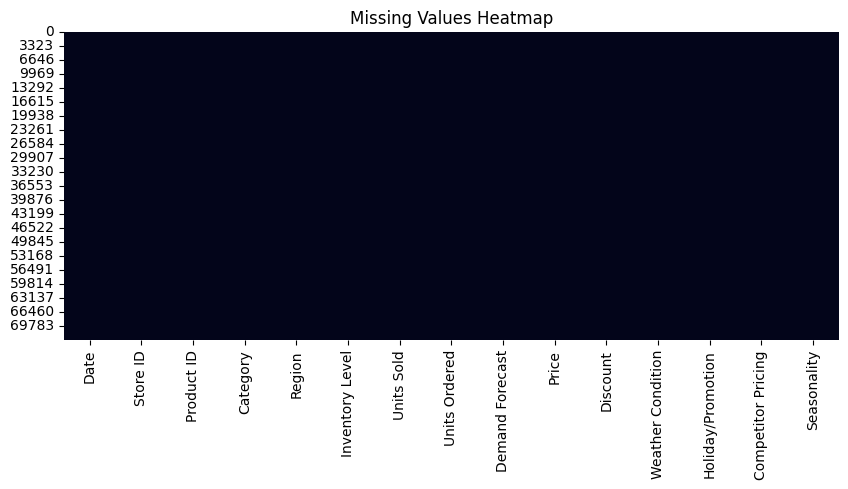

In [143]:
plt.figure(figsize=(10, 4))
sns.heatmap(df.isnull(), cbar=False)
plt.title("Missing Values Heatmap")

In [144]:
import plotly.express as px

numerical_columns = ['Inventory Level','Units Sold','Units Ordered','Price','Discount','Competitor Pricing']

for col in numerical_columns:
    fig = px.box(
        df,
        x=col,
        template="plotly_white",
        color_discrete_sequence=['#636efa'],
    )
    fig.update_layout(
        height=400,
        width=800,
        title_text=col
    )
    fig.show()


- Inventory: The median inventory level is around 200, with a range of 100 to 500. There are some outliers with inventory levels above 500, indicating potential stockpiling or overstocking.

- Sales: The median sales are around 100, with a range of 50 to 200. There are some outliers with sales above 200, indicating high demand or promotional activities.

- Orders: The median orders are around 100, with a range of 50 to 200. Similar to sales, there are outliers with orders above 200, indicating high demand or restocking.

- Price: The median price is around 30, with a range of 10 to 70. There are outliers with prices above 70, indicating premium products or high-margin items.

- Discount: The median discount is around 10%, with a range of 0 to 20%. There are outliers with discounts above 20%, indicating aggressive pricing strategies or clearance sales.

- Competitor Price: The median competitor price is around 30, with a range of 20 to 60. There are outliers with competitor prices above 60, indicating high competition or premium products.

In [145]:
Category_values = df['Category'].unique()
Category_count = df['Category'].value_counts().reset_index()
print(Category_values)
print(Category_count)


['Groceries' 'Toys' 'Electronics' 'Furniture' 'Clothing']
      Category  count
0    Furniture  14699
1         Toys  14643
2     Clothing  14626
3    Groceries  14611
4  Electronics  14521


## To shows how frequently each category appears  

C:\Users\abdal\AppData\Local\Temp\ipykernel_36892\3580972335.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




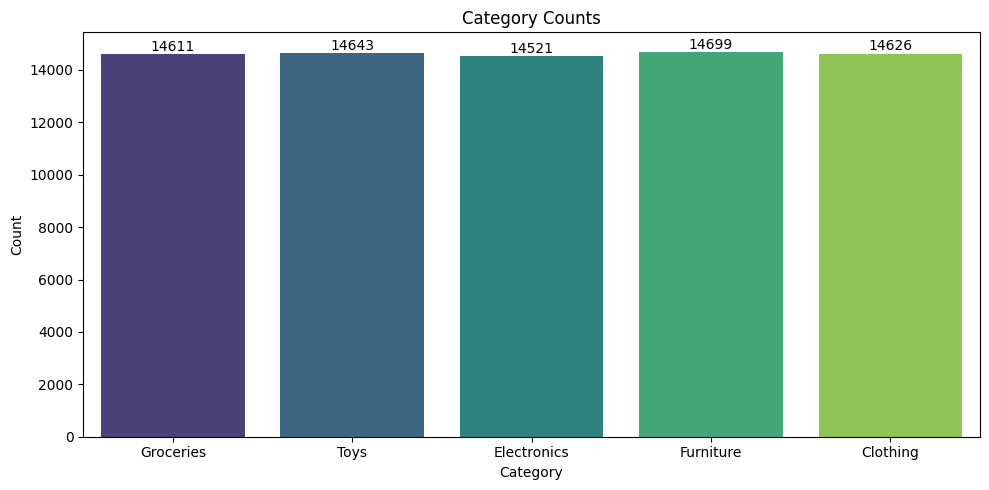

In [146]:
plt.figure(figsize=(10, 5))
bars = sns.countplot(data=df, x='Category', palette='viridis')
plt.xlabel('Category')
plt.ylabel('Count')
plt.title('Category Counts')

# Correct: Iterate over bars.patches
for bar in bars.patches:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height + 1,  # Slightly above the bar
        f'{int(height)}',
        ha='center',
        va='bottom'
    )

plt.tight_layout()
plt.show()

C:\Users\abdal\AppData\Local\Temp\ipykernel_36892\573098285.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




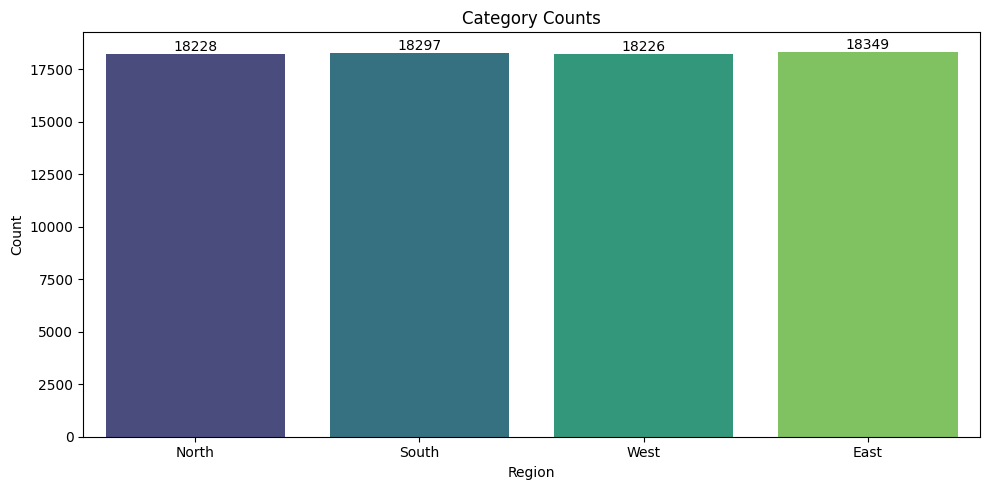

In [147]:
plt.figure(figsize=(10, 5))
bars = sns.countplot(data=df, x='Region', palette='viridis')
plt.xlabel('Region')
plt.ylabel('Count')
plt.title('Category Counts')

# Correct: Iterate over bars.patches
for bar in bars.patches:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height + 1,  # Slightly above the bar
        f'{int(height)}',
        ha='center',
        va='bottom'
    )

plt.tight_layout()
plt.show()

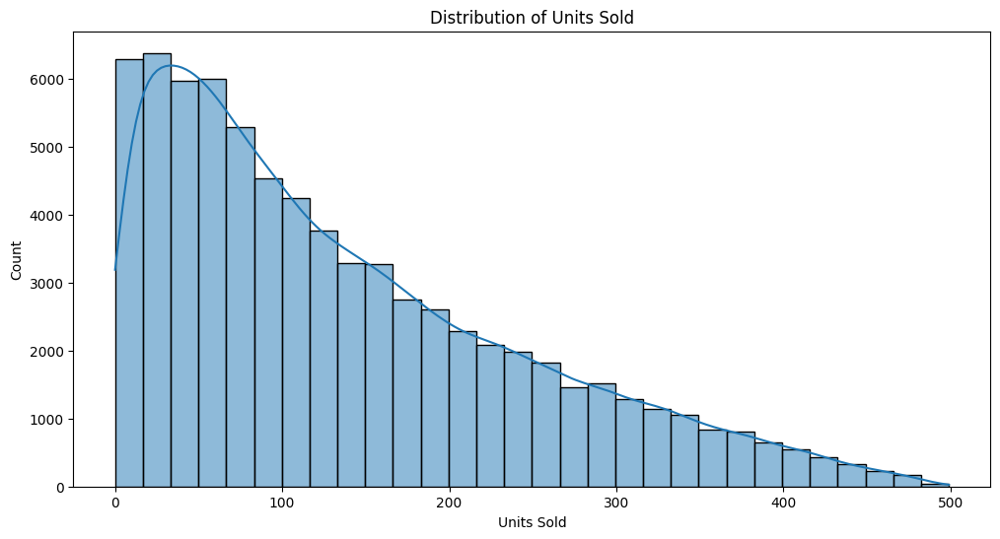

In [148]:
# Numerical Variables: Units Sold Distribution
plt.figure(figsize=(12, 6))
sns.histplot(df['Units Sold'], kde=True, bins=30)
plt.title('Distribution of Units Sold')
plt.show()


- This computes the Pearson correlation coefficients between pairs of numerical variables in your dataset.

- Correlation measures the strength and direction of a linear relationship between two variables:

- +1: Perfect positive correlation (both increase together)

- -1: Perfect negative correlation (one increases while the other decreases)

- 0: No linear correlation

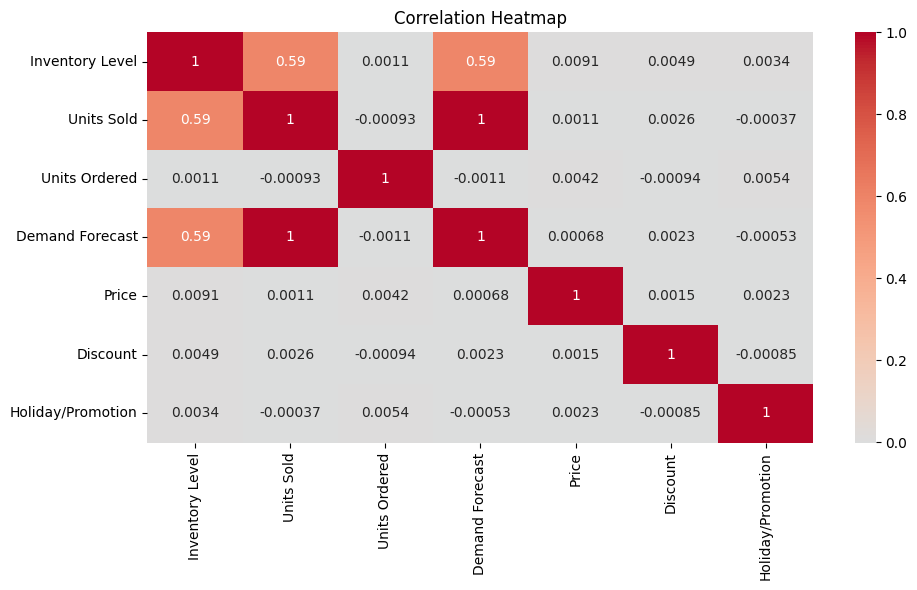

In [149]:
# Correlation Analysis
corr_cols = ['Inventory Level', 'Units Sold', 'Units Ordered', 'Demand Forecast',
            'Price', 'Discount', 'Holiday/Promotion']
corr_matrix = df[corr_cols].corr()

plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

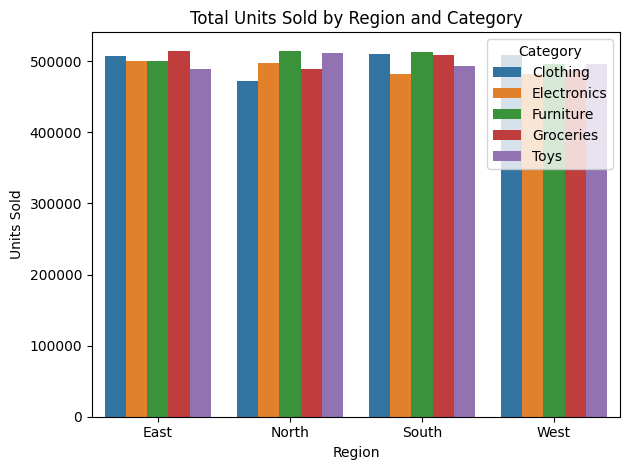

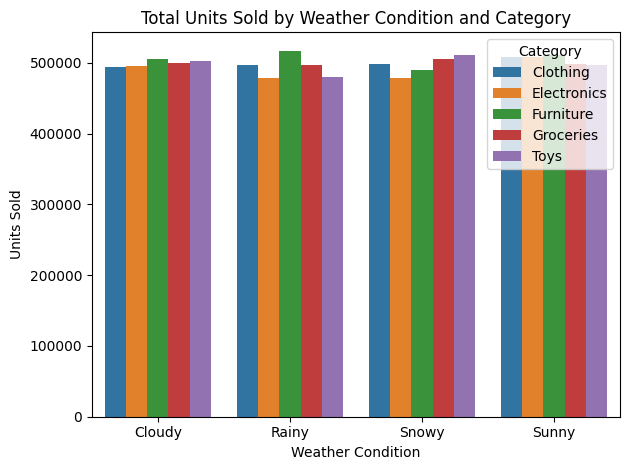

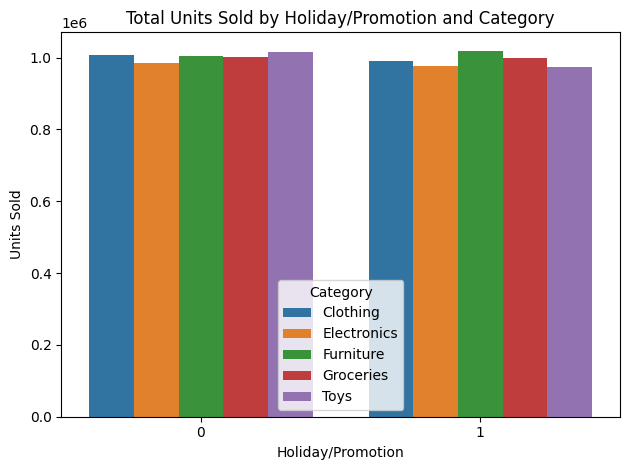

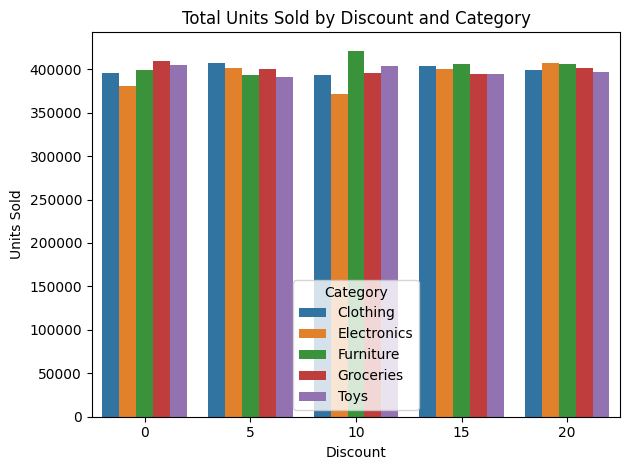

In [ ]:
# 1. Units Sold by Region and Category
region_cat = df.groupby(['Region', 'Category'])['Units Sold'].sum().reset_index()
sns.barplot(x="Region", y="Units Sold", hue="Category", data=region_cat)
plt.title("Total Units Sold by Region and Category")
plt.tight_layout()
plt.show()

# 2. Units Sold by Weather Condition and Category
weather_cat = df.groupby(['Weather Condition', 'Category'])['Units Sold'].sum().reset_index()
sns.barplot(x="Weather Condition", y="Units Sold", hue="Category", data=weather_cat)
plt.title("Total Units Sold by Weather Condition and Category")
plt.tight_layout()
plt.show()

# 3. Units Sold by Holiday/Promotion and Category
holiday_cat = df.groupby(['Holiday/Promotion', 'Category'])['Units Sold'].sum().reset_index()
sns.barplot(x="Holiday/Promotion", y="Units Sold", hue="Category", data=holiday_cat)
plt.title("Total Units Sold by Holiday/Promotion and Category")
plt.tight_layout()
plt.show()

# 4. Units Sold by Discount and Category
discount_cat = df.groupby(['Discount', 'Category'])['Units Sold'].sum().reset_index()
sns.barplot(x="Discount", y="Units Sold", hue="Category", data=discount_cat)
plt.title("Total Units Sold by Discount and Category")
plt.tight_layout()
plt.show()

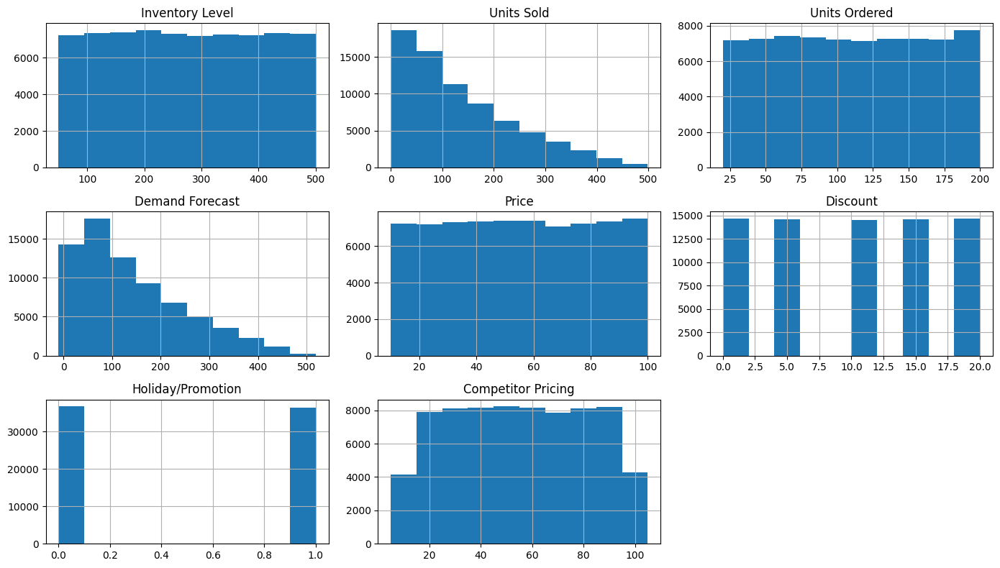

In [151]:
df.hist(figsize=(14, 8))
plt.tick_params(axis='both', which='major', labelsize=12)
plt.tight_layout()
plt.show()

# Feature Engineering

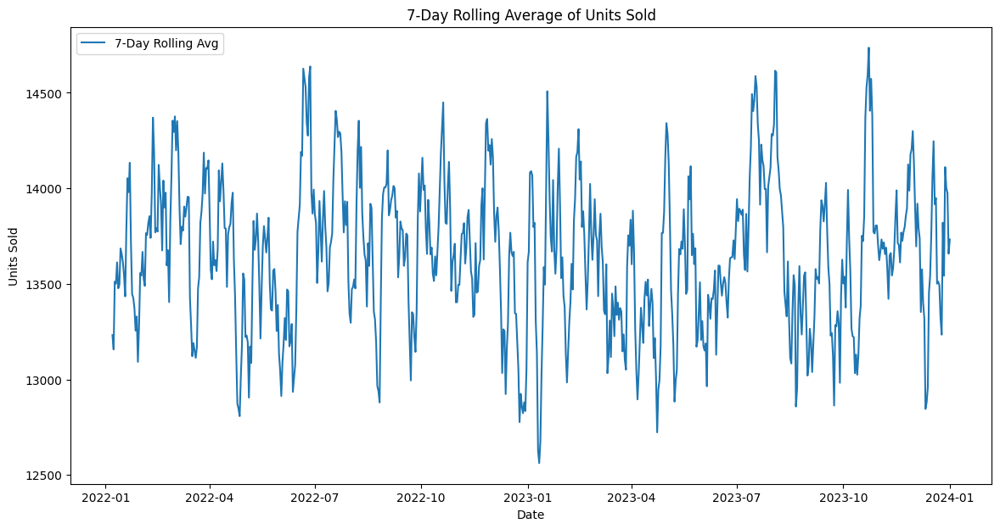

In [ ]:
# Feature Engineering
df['Date'] = pd.to_datetime(df['Date'])

# 2. Time-Based Features
df['Month'] = df['Date'].dt.month_name()
df['DayOfWeek'] = df['Date'].dt.day_name()
df['HolidayFlag'] = df['Holiday/Promotion'].apply(lambda x: 'Holiday' if x == 1 else 'Non-Holiday')
df['Discount_Effect'] = df['Units Sold'] / (df['Discount'] + 1e-6)

daily_sales = df.groupby('Date')['Units Sold'].sum().sort_index()

# Calculate 7-day rolling mean
daily_sales_rolling = daily_sales.rolling(window=7).mean()

# Plot rolling average
plt.figure(figsize=(14, 7))
plt.plot(daily_sales_rolling.index, daily_sales_rolling.values, label='7-Day Rolling Avg')
plt.title('7-Day Rolling Average of Units Sold')
plt.xlabel('Date')
plt.ylabel('Units Sold')
plt.legend()
plt.show()


- Average sales range: The rolling average generally stays between 13,000 and 14,500 units, indicating a consistent sales volume over time.
- Daily sales are highly variable, but when smoothed, the 7-day rolling average reveals that sales are relatively stable over the two years.
- There are recurring short-term peaks and troughs, possibly linked to marketing activities, pay cycles, or external factors.
- No major upward or downward trend is visible, suggesting the business maintains a steady sales rate over time.

C:\Users\abdal\AppData\Local\Temp\ipykernel_36892\190770733.py:11: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



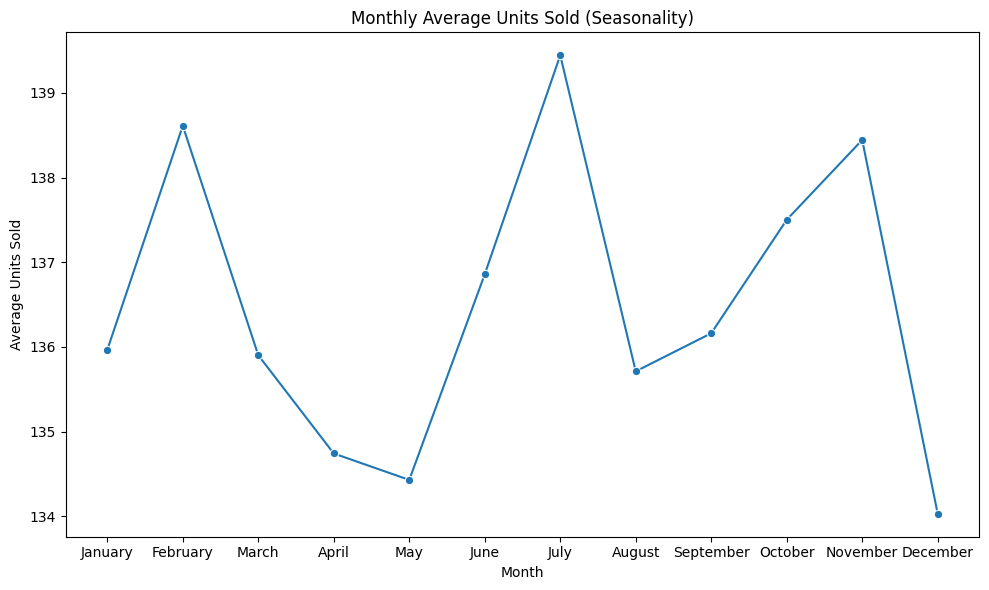

In [153]:
# Convert 'Date' column to datetime if not already
df['Date'] = pd.to_datetime(df['Date'])

# Extract month names and set correct order
df['Month'] = df['Date'].dt.month_name()
month_order = ['January', 'February', 'March', 'April', 'May', 'June',
                'July', 'August', 'September', 'October', 'November', 'December']
df['Month'] = pd.Categorical(df['Month'], categories=month_order, ordered=True)

# Group and compute mean units sold per month
monthly_sales = df.groupby('Month')['Units Sold'].mean().reset_index()

# Plot
plt.figure(figsize=(10, 6))
sns.lineplot(
    x='Month',
    y='Units Sold',
    data=monthly_sales,
    marker='o'
)
plt.title('Monthly Average Units Sold (Seasonality)')
plt.xlabel('Month')
plt.ylabel('Average Units Sold')
plt.tight_layout()
plt.show()


- This line chart displays the average number of units sold each month over a year. It helps identify seasonal patterns in sales
- February and July have the highest average units sold, with July being the absolute peak.
- November also shows a relatively high value.

- May and December have the lowest average units sold, with December being the lowest point of the year.

- Sales rise sharply from January to February, then decline until May.

- There’s a strong increase from May to July, followed by a drop in August.

- Sales climb again from August to November, before dropping sharply in December.

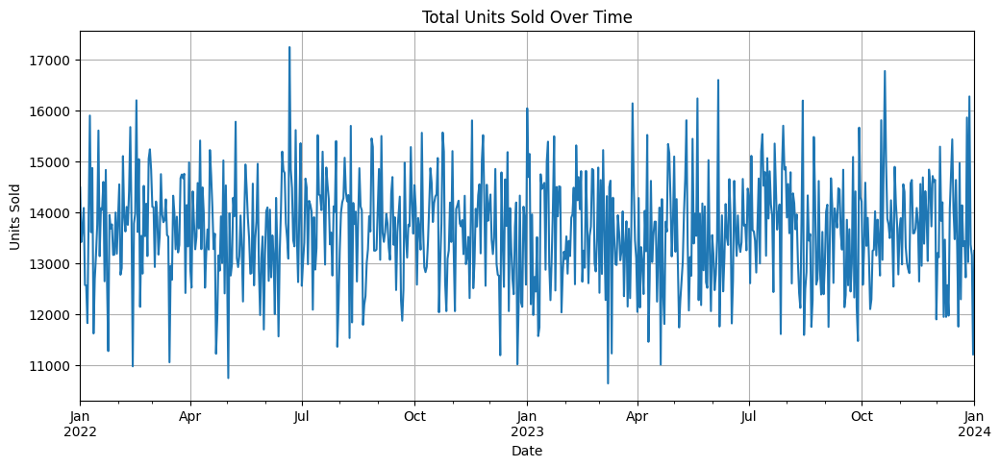

In [154]:
# Total Daily Sales Over Time
plt.figure(figsize=(12,5))
df.groupby('Date')['Units Sold'].sum().plot()
plt.title('Total Units Sold Over Time')
plt.xlabel('Date')
plt.ylabel('Units Sold')
plt.grid()
plt.show()

- High variability: There are significant daily fluctuations in sales, with units sold ranging from about 11,000 to over 17,000.
- No clear long-term trend: The data points are scattered, and while there are occasional spikes and dips, the overall level of daily sales appears relatively stable across the two-year period.
- Seasonal or periodic spikes: Some days stand out with much higher sales, possibly due to promotions, holidays, or special events.

## Second Milestone: Data Analysis and Visualization 

In [155]:
# Handle remaining missing values (if any)
df.fillna({
    'Weather Condition': 'Unknown',
    'Competitor Pricing': df['Competitor Pricing'].median(),
    'Demand Forecast': df['Demand Forecast'].mean()
}, inplace=True)

# Remove outliers using IQR for key numerical features
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    return df[(df[column] >= Q1 - 1.5*IQR) & (df[column] <= Q3 + 1.5*IQR)]

df = remove_outliers(df, 'Units Sold')
df = remove_outliers(df, 'Price')

# Standardize categorical values
df['Weather Condition'] = df['Weather Condition'].str.title()
df['Region'] = df['Region'].str.upper()


In [156]:
# Statistical Analysis

# Correlation analysis (Promotions, Weather, Holidays)
correlation_matrix = df[['Units Sold', 'Discount', 'Holiday/Promotion']].corr()
print("Correlation Matrix:\n", correlation_matrix)

# Hypothesis Testing: Holiday impact on sales
holiday_sales = df[df['Holiday/Promotion'] == 1]['Units Sold']
non_holiday_sales = df[df['Holiday/Promotion'] == 0]['Units Sold']
t_stat, p_value = stats.ttest_ind(holiday_sales, non_holiday_sales)
print(f"\nHoliday Sales T-Test: p-value = {p_value:.4f}")

# ANOVA: Weather impact on sales
weather_groups = df.groupby('Weather Condition')['Units Sold'].apply(list)
f_stat, p_value = stats.f_oneway(*weather_groups)
print(f"Weather Impact ANOVA: p-value = {p_value:.4f}")


Correlation Matrix:
                    Units Sold  Discount  Holiday/Promotion
Units Sold           1.000000  0.000869           0.001545
Discount             0.000869  1.000000          -0.001137
Holiday/Promotion    0.001545 -0.001137           1.000000

Holiday Sales T-Test: p-value = 0.6777
Weather Impact ANOVA: p-value = 0.1216


In [ ]:
# Interactive Time-Series Analysis
fig1 = px.line(df.groupby('Date')['Units Sold'].sum().reset_index(),
            x='Date', y='Units Sold',
            title='Interactive Sales Trend',
            template='plotly_dark')
fig1.update_layout(hovermode="x unified")

fig1.show()

import pandas as pd
import plotly.express as px

df['Date'] = pd.to_datetime(df['Date'])
df['Month'] = df['Date'].dt.month_name()

month_order = ['January', 'February', 'March', 'April', 'May', 'June','July', 'August', 'September', 'October', 'November', 'December']

fig2 = px.box(
    df,
    x='Month',
    y='Units Sold',
    color='Holiday/Promotion',
    category_orders={'Month': month_order},
    title='Monthly Sales Distribution with Holiday Impact',
    labels={'Units Sold': 'Sales Volume'},
    color_discrete_sequence=px.colors.qualitative.Vivid
)

fig2.update_layout(hovermode="closest")
fig2.show()


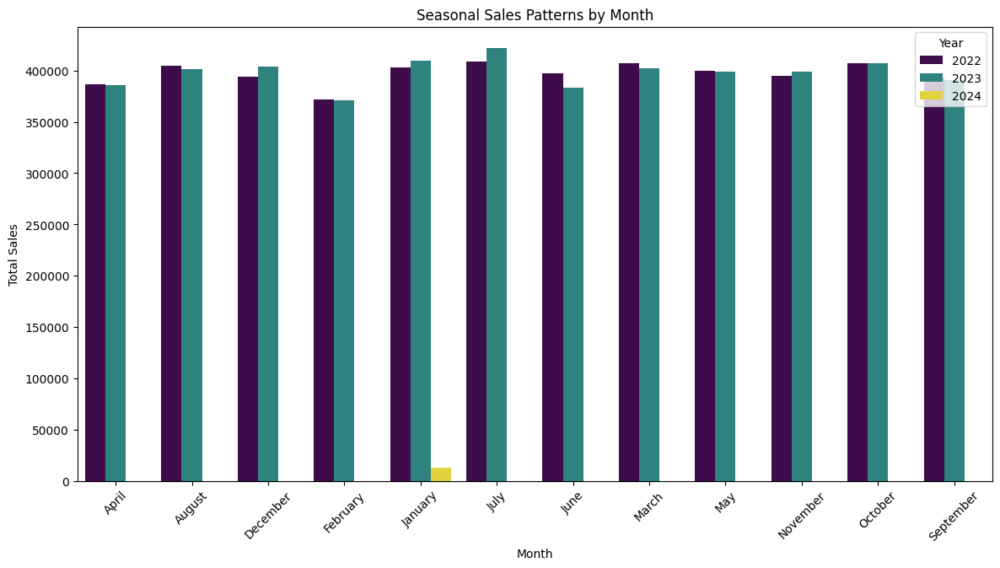

In [191]:
## Extract month and year from date
df['Month'] = df['Date'].dt.month_name()
df['Year'] = df['Date'].dt.year

# Aggregate monthly sales
monthly_sales = df.groupby(['Year', 'Month'])['Units Sold'].sum().reset_index()

# Seasonal bar chart
plt.figure(figsize=(14, 7))
sns.barplot(
    data=monthly_sales,
    x='Month',
    y='Units Sold',
    hue='Year',
    palette='viridis'
)
plt.title('Seasonal Sales Patterns by Month')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.xticks(rotation=45)
plt.legend(title='Year')
plt.show()

- Across most months and years, total sales remain relatively stable, typically ranging between 370,000 and 420,000 units. This indicates a consistent sales performance throughout the observed period.
- Certain months, such as July and February, tend to show slightly higher sales, while months like April and June occasionally dip lower. However, these fluctuations are not extreme, suggesting only mild seasonality in sales.
- There are no dramatic shifts in monthly sales from year to year. The bars for 2022 and 2023 are almost identical for each month, highlighting a stable sales trend. Data for 2024 is incomplete, with only a small value shown for January, likely due to partial data collection at the time of analysis.
- The notably shorter bar for January 2024 reflects that only a portion of the month’s sales data was available, rather than an actual decrease in sales.

In [189]:
fig = px.scatter(
    df,
    x='Price',
    y='Units Sold',
    color='Category',
    trendline='ols',
    title='Price vs. Sales Volume (by Category)',
    labels={'Price': 'Product Price', 'Units Sold': 'Sales Volume'},
    hover_data=['Region', 'Weather Condition'],
    color_discrete_sequence = px.colors.qualitative.Vivid
)

fig.update_layout(legend=dict(orientation='h', yanchor='bottom', y=1.02))
fig.show()

In [ ]:

df = df.dropna(subset=['Holiday/Promotion', 'Units Sold'])

df['Units Sold'] = pd.to_numeric(df['Units Sold'], errors='coerce')

holiday_sales = df.groupby('Holiday/Promotion')['Units Sold'].mean().reset_index()

import plotly.express as px

fig = px.bar(
    holiday_sales,
    x='Holiday/Promotion',
    y='Units Sold',
    color='Holiday/Promotion',
    title='Average Sales: Holiday vs. Non-Holiday',
    labels={'Holiday/Promotion': 'Holiday Status', 'Units Sold': 'Average Sales'},
    text_auto='.2f',
    color_discrete_sequence=['lightblue', 'lightsalmon'],
    template='plotly_white'
)

fig.update_layout(
    showlegend=True,
    plot_bgcolor='white',
    paper_bgcolor='white',
    font=dict(size=12, color='black'),
    xaxis=dict(gridcolor='lightgray'),
    yaxis=dict(gridcolor='lightgray')
)

fig.update_traces(
    marker_line_color='black',
    marker_line_width=1,
    opacity=0.8
)
fig.show()

C:\Users\abdal\AppData\Local\Temp\ipykernel_36892\585297379.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




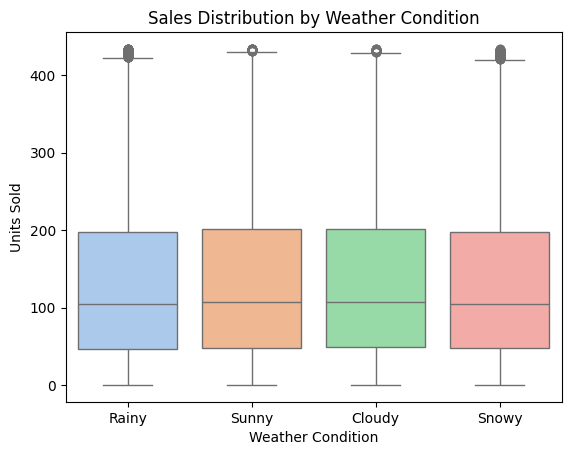

In [161]:
# Weather Impact on Sales (Box Plot)
sns.boxplot(
    data=df,
    x='Weather Condition',
    y='Units Sold',
    palette='pastel'
)
plt.title('Sales Distribution by Weather Condition')
plt.show()

# Third Milestone: Forecasting Model Development and Optimization 

In [ ]:
# Load and preprocess data
df = pd.read_csv("retail_store_inventory.csv")
df["Date"] = pd.to_datetime(df["Date"])
df["Demand Forecast"] = df["Demand Forecast"].apply(lambda x: None if x < 0 else x)
df["Month"] = df["Date"].dt.month
df["DayOfWeek"] = df["Date"].dt.dayofweek

# Features and target
features = ['Month', 'DayOfWeek', 'Discount', 'Holiday/Promotion',
            'Weather Condition', 'Seasonality', 'Demand Forecast',
            'Competitor Pricing', 'Price']
target = 'Units Sold'

# Drop missing
model_df = df[features + [target]].dropna()
X = model_df[features]
y = model_df[target]

# Categorical & numerical features
categorical_features = ['Weather Condition', 'Seasonality']
numerical_features = ['Month', 'DayOfWeek', 'Discount', 'Holiday/Promotion','Demand Forecast', 'Competitor Pricing', 'Price']

# Preprocessing and pipeline
preprocessor = ColumnTransformer([
    ('num', StandardScaler(), numerical_features),
    ('cat', OneHotEncoder(drop='first'), categorical_features)
])

pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Train the model
pipeline.fit(X_train, y_train)

# Predict and evaluate
train_r2 = pipeline.score(X_train, y_train)
test_r2 = pipeline.score(X_test, y_test)

# Predict
y_pred = pipeline.predict(X_test)

# Corrected MAPE: ignore y_test = 0
non_zero_idx = y_test != 0
mape = np.mean(np.abs((y_test[non_zero_idx] - y_pred[non_zero_idx]) / y_test[non_zero_idx])) * 100

# Print results
print(f"Train R² Score: {train_r2:.4f}")
print(f"Test R² Score : {test_r2:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred))}")
print(f"MAE: {mean_absolute_error(y_test, y_pred)}")
print(f"MAPE: {mape:.2f}%")

joblib.dump(pipeline, "sales_forecast_model.pkl")


Train R² Score: 0.9938
Test R² Score : 0.9935
RMSE: 8.670940205161353
MAE: 7.499178276809347
MAPE: 18.79%


['sales_forecast_model.pkl']

# Futh Milestone: MLOps, Deployment, and Monitoring 

In [ ]:
mlflow.set_tracking_uri(uri = "http://127.0.0.1:5000")

# python -m mlflow ui --backend-store-uri sqlite:///mlflow.db --default-artifact-root ./mlruns --host 127.0.0.1 --port 5000

In [165]:
mlflow.set_experiment("Sales Forecasting")

<Experiment: artifact_location='file:E:/Sales_Forecasting_Project/mlruns/1', creation_time=1746807964199, experiment_id='1', last_update_time=1746807964199, lifecycle_stage='active', name='Sales Forecasting', tags={}>

In [166]:
with mlflow.start_run() as run:
    mlflow.log_param("test_size", 0.2)
    mlflow.log_param("model_type", "LinearRegression")
    mlflow.log_param("fit_intercept", pipeline.named_steps["regressor"].fit_intercept)

    pipeline.fit(X_train, y_train)

    y_pred = pipeline.predict(X_test)
    mse  = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae  = mean_absolute_error(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)

    mlflow.log_metric("Train R²",train_r2)
    mlflow.log_metric("Test R²",test_r2)
    mlflow.log_metric("MSE", mse)
    mlflow.log_metric("RMSE", rmse)
    mlflow.log_metric("MAE", mae)
    mlflow.log_metric("MAPE", mape)

    mlflow.set_tag("run_purpose", "Initial sales forecasting pipeline with signature")

    signature = infer_signature(X_train, pipeline.predict(X_train))

    mlflow.sklearn.log_model(
        sk_model=pipeline,
        artifact_path="sales_forecast_model",
        signature=signature
    )
    print(f"Run completed: {run.info.run_id}")

C:\Users\abdal\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\mlflow\types\utils.py:452: UserWarning:

Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.



Run completed: 7d63c49e8ba04e24971d13dacace1975
🏃 View run masked-bass-414 at: http://127.0.0.1:5000/#/experiments/1/runs/7d63c49e8ba04e24971d13dacace1975
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/1


## Streamlit App Prediction and interactive Visualization Dashboard
- App Link: https://final-project-depi-data-science.streamlit.app/